# **File ipynb for classification**

**11/08/2023**

This file contains a supervised classification analysis on data collected in 2022. We utilized labeled data collected by Davide and applied various algorithms for the supervised classification task.


**FILES:**
We have 22 file called in the following way. 
 - POW000.json

  ...

 - POW021.json 
 
 Aggiungere descrizione dei file json !!!!!!



In [1]:
import json 
import os
import pandas as pd
import seaborn as sns

%matplotlib inline
import matplotlib.pyplot as plt

import math 
import numpy as np

Da un file Json otteniamo un dataset pandas 

In [2]:
# Get the current directory (where your Python script is located)
current_directory = os.path.dirname('ML_POW')

# Initialize an empty list to store the rows
rows = []

# Iterate through all the JSON files in the specified range
for i in range(0, 22):
    # Generate the file name (assuming the format is POWxxx.json)
    json_file_name = f'POW{i:03d}.json'
    json_file_path = os.path.join(current_directory, 'DB_Macchinine', json_file_name)

    # Check if the file exists before attempting to read it
    if os.path.exists(json_file_path):
        with open(json_file_path, 'r') as json_file:
            data = json.load(json_file)

        # Iterate through the JSON data
        for key, value in data.items():
            user_id = value['UserID']
            readings = value['Readings']
            for reading_key, reading_value in readings.items():
                phase = reading_value['Phase']
                if phase in ["sudoku", "baseline occhi chiusi"]:
                    time = reading_value['Time']
                    af3_theta = reading_value['AF3']['Theta']
                    af3_alpha = reading_value['AF3']['Alpha']
                    af3_betaL = reading_value['AF3']['BetaL']
                    af3_betaH = reading_value['AF3']['BetaH']
                    af3_gamma = reading_value['AF3']['Gamma']

                    t7_theta = reading_value['T7']['Theta']
                    t7_alpha = reading_value['T7']['Alpha']
                    t7_betaL = reading_value['T7']['BetaL']
                    t7_betaH = reading_value['T7']['BetaH']
                    t7_gamma = reading_value['T7']['Gamma']

                    pz_theta = reading_value['Pz']['Theta']
                    pz_alpha = reading_value['Pz']['Alpha']
                    pz_betaL = reading_value['Pz']['BetaL']
                    pz_betaH = reading_value['Pz']['BetaH']
                    pz_gamma = reading_value['Pz']['Gamma']

                    t8_theta = reading_value['T8']['Theta']
                    t8_alpha = reading_value['T8']['Alpha']
                    t8_betaL = reading_value['T8']['BetaL']
                    t8_betaH = reading_value['T8']['BetaH']
                    t8_gamma = reading_value['T8']['Gamma']

                    af4_theta = reading_value['AF4']['Theta']
                    af4_alpha = reading_value['AF4']['Alpha']
                    af4_betaL = reading_value['AF4']['BetaL']
                    af4_betaH = reading_value['AF4']['BetaH']
                    af4_gamma = reading_value['AF4']['Gamma']


                    row = [user_id, phase, time, af3_theta, af3_alpha, af3_betaL, af3_betaH, af3_gamma, t7_theta, t7_alpha, t7_betaL, t7_betaH, t7_gamma,
                           pz_theta, pz_alpha, pz_betaL, pz_betaH, pz_gamma, t8_theta, t8_alpha, t8_betaL, t8_betaH, t8_gamma,
                           af4_theta, af4_alpha, af4_betaL, af4_betaH, af4_gamma]

                    rows.append(row)

# Define columns as before
columns = ['UserID', 'Phase', 'Time', 'AF3_Theta', 'AF3_Alpha', 'AF3_BetaL', 'AF3_BetaH', 'AF3_Gamma', 
           'T7_Theta', 'T7_Alpha', 'T7_BetaL', 'T7_BetaH', 'T7_Gamma', 
           'Pz_Theta', 'Pz_Alpha', 'Pz_BetaL', 'Pz_BetaH', 'Pz_Gamma', 
           'T8_Theta', 'T8_Alpha', 'T8_BetaL', 'T8_BetaH', 'T8_Gamma', 
           'AF4_Theta', 'AF4_Alpha', 'AF4_BetaL', 'AF4_BetaH', 'AF4_Gamma']

# Create a DataFrame from the rows and columns
df = pd.DataFrame(rows, columns=columns)

# Filter the DataFrame to only include rows with 'Phase' as "sudoku" or "baseline occhi chiusi"
filtered_df = df[df['Phase'].isin(["sudoku", "baseline occhi chiusi"])]


In [3]:
columns_to_remove = ['UserID', 'Time']
filtered_df.drop(columns=columns_to_remove, inplace=True)
print(filtered_df.shape)
filtered_df.head()

(38279, 26)


,Phase,AF3_Theta,AF3_Alpha,AF3_BetaL,AF3_BetaH,AF3_Gamma,T7_Theta,T7_Alpha,T7_BetaL,T7_BetaH,...,T8_Theta,T8_Alpha,T8_BetaL,T8_BetaH,T8_Gamma,AF4_Theta,AF4_Alpha,AF4_BetaL,AF4_BetaH,AF4_Gamma
0,baseline occhi chiusi,2.514,4.049,6.891,3.734,2.143,3.878,3.109,4.454,3.1,...,3.368,9.275,10.638,3.768,3.033,3.03,5.133,6.916,4.916,2.152
1,baseline occhi chiusi,2.184,3.739,5.57,3.868,2.017,3.327,3.66,4.823,3.116,...,3.754,10.035,10.933,3.293,2.756,2.583,4.833,5.746,5.199,2.108
2,baseline occhi chiusi,2.03,3.471,4.345,3.931,1.849,2.814,4.142,5.099,3.022,...,4.156,10.042,10.698,2.928,2.48,2.429,4.343,4.658,5.4,2.024
3,baseline occhi chiusi,2.059,3.598,3.408,3.924,1.706,2.552,4.518,5.164,2.871,...,4.449,9.434,9.763,2.688,2.236,2.457,4.088,3.804,5.43,1.931
4,baseline occhi chiusi,2.361,4.377,2.791,3.916,1.643,2.659,4.794,4.94,2.771,...,4.548,8.518,8.255,2.589,2.066,2.977,4.451,3.207,5.29,1.858


### Dataset Exploration

- Balance
- Missing values
- Variable types
- Variable distributions
- Potential variable transformations
- Variable distributions separated by phase

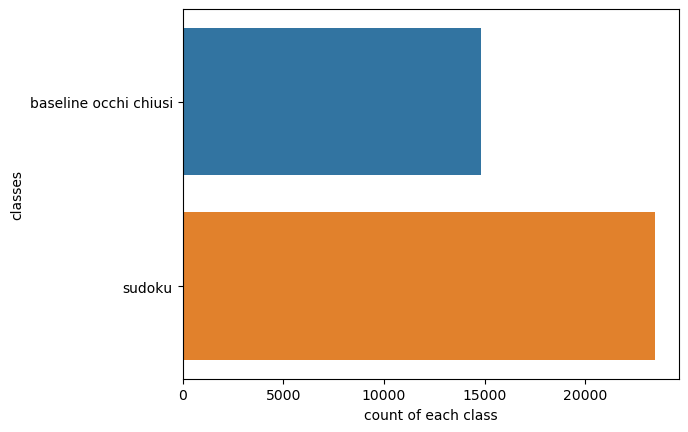

In [4]:
#Visualize Class Counts
sns.countplot(y=filtered_df.Phase ,data=filtered_df) 
plt.xlabel("count of each class")
plt.ylabel("classes")
plt.show()

In [5]:
filtered_df.isna().any()


Phase        False
AF3_Theta    False
AF3_Alpha    False
AF3_BetaL    False
AF3_BetaH    False
AF3_Gamma    False
T7_Theta     False
T7_Alpha     False
T7_BetaL     False
T7_BetaH     False
T7_Gamma     False
Pz_Theta     False
Pz_Alpha     False
Pz_BetaL     False
Pz_BetaH     False
Pz_Gamma     False
T8_Theta     False
T8_Alpha     False
T8_BetaL     False
T8_BetaH     False
T8_Gamma     False
AF4_Theta    False
AF4_Alpha    False
AF4_BetaL    False
AF4_BetaH    False
AF4_Gamma    False
dtype: bool

In [6]:
print(filtered_df.dtypes)

Phase        object
AF3_Theta    object
AF3_Alpha    object
AF3_BetaL    object
AF3_BetaH    object
AF3_Gamma    object
T7_Theta     object
T7_Alpha     object
T7_BetaL     object
T7_BetaH     object
T7_Gamma     object
Pz_Theta     object
Pz_Alpha     object
Pz_BetaL     object
Pz_BetaH     object
Pz_Gamma     object
T8_Theta     object
T8_Alpha     object
T8_BetaL     object
T8_BetaH     object
T8_Gamma     object
AF4_Theta    object
AF4_Alpha    object
AF4_BetaL    object
AF4_BetaH    object
AF4_Gamma    object
dtype: object


In [7]:
columns_to_convert = [
    'AF3_Theta', 'AF3_Alpha', 'AF3_BetaL', 'AF3_BetaH', 'AF3_Gamma',
    'T7_Theta',  'T7_Alpha',  'T7_BetaL',  'T7_BetaH',  'T7_Gamma',
    'Pz_Theta',  'Pz_Alpha',  'Pz_BetaL',  'Pz_BetaH',  'Pz_Gamma',
    'T8_Theta',  'T8_Alpha',  'T8_BetaL',  'T8_BetaH',  'T8_Gamma',
    'AF4_Theta', 'AF4_Alpha', 'AF4_BetaL', 'AF4_BetaH', 'AF4_Gamma'
]

# Use the astype method to convert columns to float
filtered_df[columns_to_convert] = filtered_df[columns_to_convert].astype(float)

In [8]:
print(filtered_df.dtypes)

Phase         object
AF3_Theta    float64
AF3_Alpha    float64
AF3_BetaL    float64
AF3_BetaH    float64
AF3_Gamma    float64
T7_Theta     float64
T7_Alpha     float64
T7_BetaL     float64
T7_BetaH     float64
T7_Gamma     float64
Pz_Theta     float64
Pz_Alpha     float64
Pz_BetaL     float64
Pz_BetaH     float64
Pz_Gamma     float64
T8_Theta     float64
T8_Alpha     float64
T8_BetaL     float64
T8_BetaH     float64
T8_Gamma     float64
AF4_Theta    float64
AF4_Alpha    float64
AF4_BetaL    float64
AF4_BetaH    float64
AF4_Gamma    float64
dtype: object


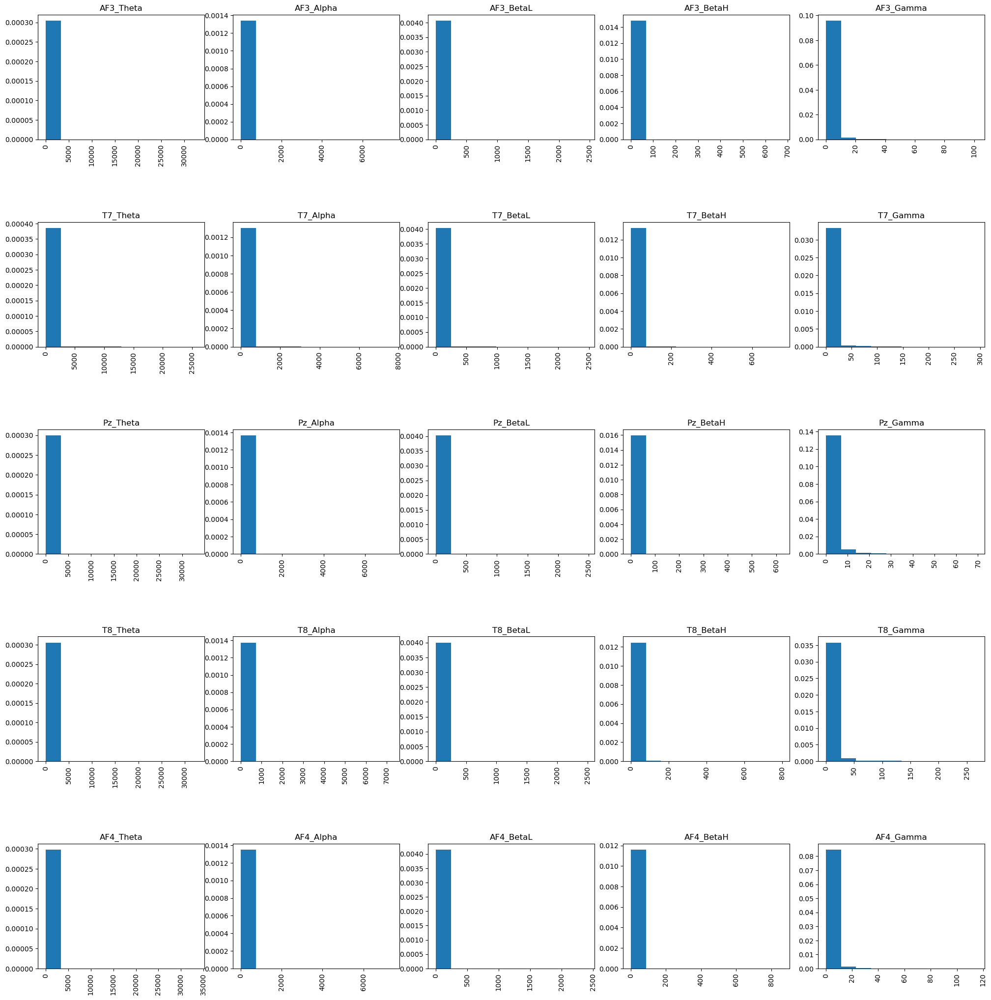

In [9]:
pow = filtered_df [columns_to_convert]

fig, axes = plt.subplots(5, 5,figsize=[20,20])
axes = axes.flatten()
fig.tight_layout(h_pad=10)

i=0
for x in pow.columns:
    plt.sca(axes[i]) # set the current Axes
    plt.hist(pow[x],density=True)
    plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 45-degrees
    plt.title(x)
    i+=1
plt.show()

In [10]:
pow_transformed = pow[columns_to_convert].apply(lambda x: x.apply(lambda y: math.log(y + 1)))


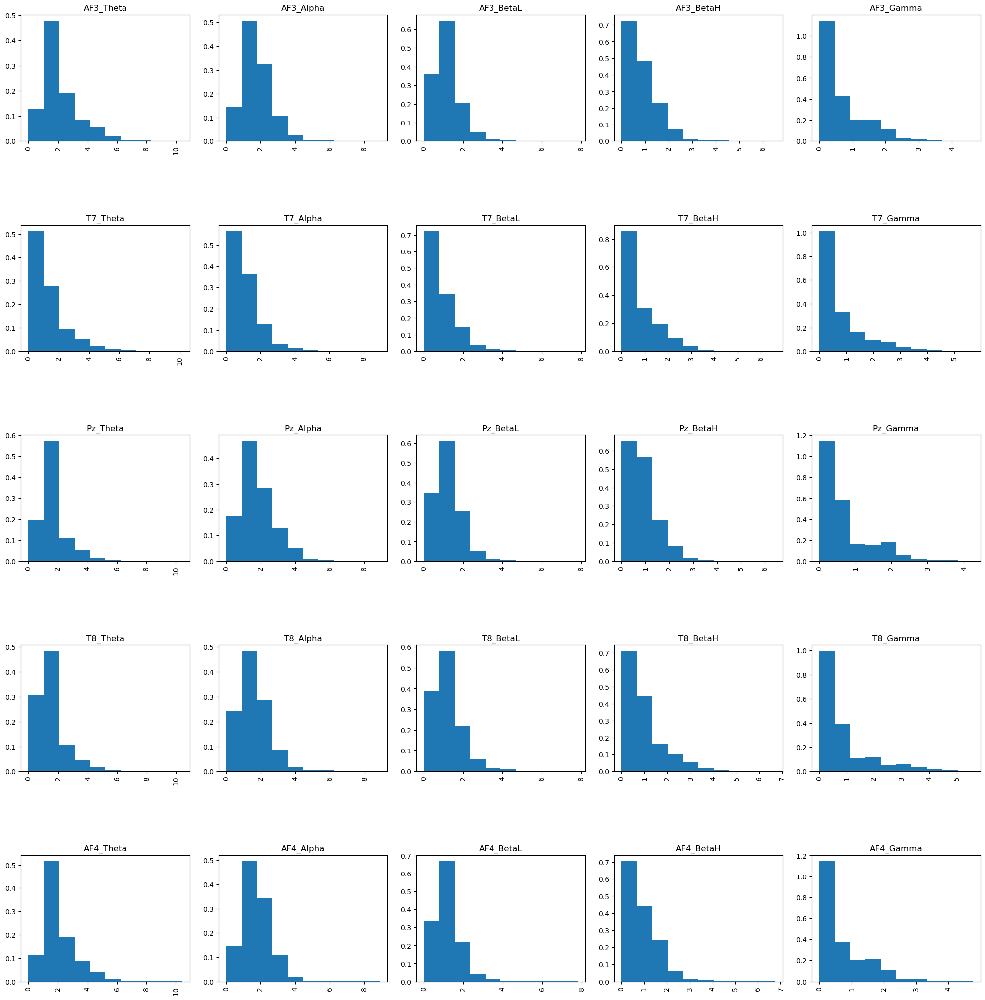

In [11]:
fig, axes = plt.subplots(5, 5,figsize=[20,20])
axes = axes.flatten()
fig.tight_layout(h_pad=10)

i=0
for x in pow_transformed.columns:
    plt.sca(axes[i]) # set the current Axes
    plt.hist(pow_transformed[x],density=True)
    plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 45-degrees
    plt.title(x)
    i+=1
plt.show()

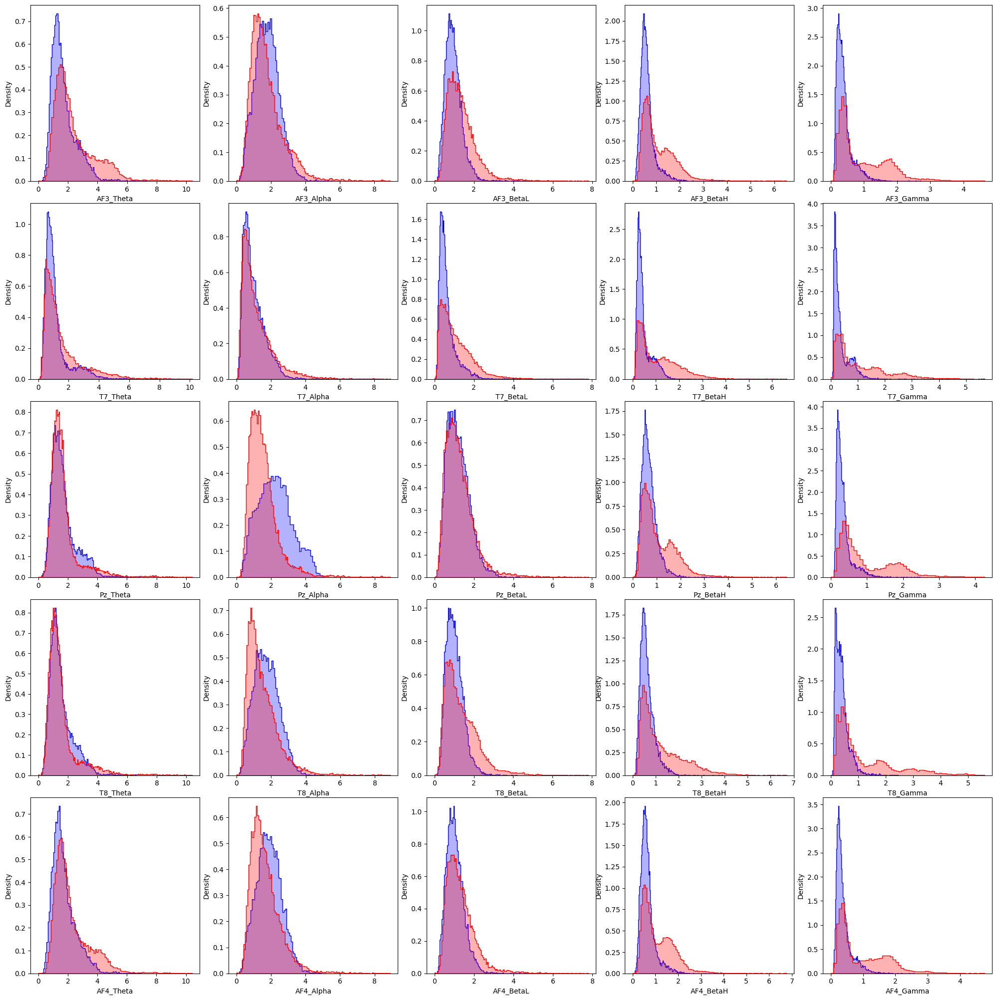

In [12]:
X0 = pow_transformed[filtered_df['Phase']=='baseline occhi chiusi']
X1 = pow_transformed[filtered_df['Phase']=='sudoku']

fig, axes = plt.subplots(ncols=5, nrows=5, figsize=(20,20))
fig.tight_layout()

for i, ax in zip(range(pow.columns.size), axes.flat):
    sns.histplot(X0.iloc[:,i], color="blue", ax=ax, stat='density', element="step",  alpha=0.3)
    sns.histplot(X1.iloc[:,i], color="red",  ax=ax,stat='density', element="step",  alpha=0.3)
plt.show()


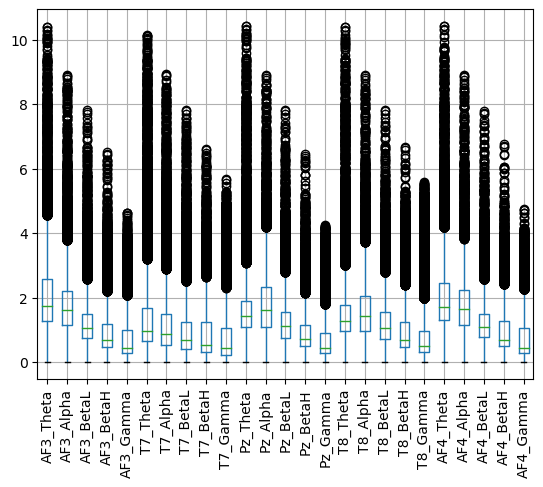

In [13]:
pow_transformed.boxplot(rot=90)


In [14]:
#PCA fit
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(pow_transformed)

PCA()

In [15]:
#let's use the pca to transform the dataset
pow_transformed_pca = pd.DataFrame(pca.transform(pow_transformed))
pow_transformed_pca.columns =['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13','PC14','PC15','PC16','PC17','PC18','PC19','PC20','PC21','PC22','PC23','PC24','PC25']
pow_transformed_pca

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25
0,1.581701,1.707734,-1.237424,-0.296597,1.195776,0.355826,-0.300462,0.071000,-0.159572,-0.006472,...,-0.394599,0.097583,-0.168264,0.037826,0.144415,-0.002061,0.009123,-0.160956,-0.014452,0.061672
1,1.414852,1.692755,-1.350465,-0.171377,1.125968,0.268860,-0.405730,-0.013081,-0.254016,0.209224,...,-0.504519,0.106392,-0.155665,0.016322,0.189147,-0.002033,-0.040845,-0.158856,-0.042273,0.048167
2,1.230685,1.661435,-1.363858,-0.048298,1.115794,0.185639,-0.453208,-0.052850,-0.360714,0.412544,...,-0.525012,0.098411,-0.170241,0.023460,0.241451,-0.030728,-0.078316,-0.160460,-0.054221,0.031629
3,1.079363,1.598692,-1.288281,0.031361,1.064726,0.165959,-0.469615,-0.094323,-0.422476,0.573542,...,-0.475656,0.079367,-0.184384,0.045423,0.290660,-0.084487,-0.090631,-0.159226,-0.043751,0.015538
4,1.055297,1.464222,-1.106247,0.026043,0.890009,0.227216,-0.448757,-0.159446,-0.424426,0.669274,...,-0.387713,0.070192,-0.179473,0.090046,0.325570,-0.137659,-0.073062,-0.149222,-0.007868,0.005323
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38274,-3.885752,0.201195,-0.417732,0.567702,-0.033344,-0.050972,0.339464,0.105534,0.143069,0.152283,...,-0.131999,-0.087234,-0.005276,0.220614,-0.033724,-0.008981,0.081999,0.044764,0.008494,-0.056810
38275,-3.893345,0.202524,-0.238806,0.600433,0.006557,0.010968,0.328857,0.093651,0.184127,0.194401,...,-0.100100,-0.070911,-0.040586,0.208887,-0.027827,0.001605,0.092701,0.031778,0.020535,-0.051366
38276,-3.868273,0.159146,-0.041072,0.674008,0.082227,0.021023,0.330743,0.084390,0.253253,0.236485,...,-0.066388,-0.058489,-0.088011,0.178242,-0.025797,0.008030,0.087159,0.025255,0.031349,-0.043742
38277,-3.820235,0.081703,0.117127,0.787009,0.185160,-0.042258,0.368658,0.090644,0.321025,0.264816,...,-0.042875,-0.054378,-0.139631,0.145542,-0.027292,0.018642,0.068536,0.023859,0.036343,-0.035443


In [16]:
pd.DataFrame(pca.components_,index=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13','PC14','PC15','PC16','PC17','PC18','PC19','PC20','PC21','PC22','PC23','PC24','PC25'],columns=pow_transformed.columns)

,AF3_Theta,AF3_Alpha,AF3_BetaL,AF3_BetaH,AF3_Gamma,T7_Theta,T7_Alpha,T7_BetaL,T7_BetaH,T7_Gamma,...,T8_Theta,T8_Alpha,T8_BetaL,T8_BetaH,T8_Gamma,AF4_Theta,AF4_Alpha,AF4_BetaL,AF4_BetaH,AF4_Gamma
PC1,0.275791,0.204202,0.169852,0.151402,0.146215,0.318421,0.240197,0.208346,0.189840,0.184668,...,0.244122,0.199229,0.185899,0.181482,0.185822,0.259456,0.189963,0.163527,0.152607,0.150021
PC2,-0.277380,-0.171969,0.031317,0.148507,0.221592,-0.131693,-0.050016,0.086255,0.218729,0.302665,...,-0.233169,-0.081559,0.117172,0.267195,0.365480,-0.276142,-0.176037,0.029412,0.150938,0.230037
PC3,0.572372,0.011455,0.065209,0.047233,0.064370,-0.014717,-0.185477,-0.044596,0.007380,0.031887,...,-0.094272,-0.342618,-0.087630,0.005950,0.044049,0.418209,-0.128843,-0.006619,0.041317,0.066494
PC4,-0.100885,-0.412718,-0.189282,-0.064861,-0.017392,0.585670,0.185463,0.167590,0.119995,0.087031,...,0.196650,-0.192167,-0.104753,-0.077469,-0.052052,-0.058343,-0.381959,-0.169672,-0.049228,-0.007477
PC5,-0.096559,-0.252396,0.367112,0.133983,-0.031593,-0.113079,-0.167739,0.060451,-0.134231,-0.266606,...,0.159656,-0.125814,0.253596,-0.031897,-0.207065,-0.035285,-0.229867,0.403445,0.130460,-0.039595
PC6,-0.058343,0.241788,0.226602,0.052144,-0.015491,0.372205,0.316291,0.228730,0.042328,-0.090602,...,-0.436297,-0.223443,-0.082318,-0.188413,-0.263146,-0.150182,0.166384,0.201827,0.061044,-0.016782
PC7,0.141829,-0.091965,-0.092182,0.090981,0.112366,-0.114495,-0.098907,-0.016930,0.031943,0.015505,...,-0.369079,-0.359083,-0.261115,-0.101609,-0.075237,0.089774,-0.134246,-0.110556,0.107388,0.119733
PC8,0.193787,-0.140268,0.073961,-0.332192,-0.220659,-0.196049,0.072197,0.335298,0.200649,0.264989,...,-0.096676,-0.045215,0.262896,-0.018339,0.111096,0.105102,-0.165108,0.072147,-0.402342,-0.241186
PC9,-0.231322,0.314117,0.161648,-0.217432,-0.007156,-0.003638,-0.168425,-0.013689,0.035358,0.236844,...,0.055947,-0.449830,-0.085913,-0.056725,0.185666,-0.148834,0.263551,0.127651,-0.232207,-0.000851
PC10,-0.039882,0.096154,-0.071202,0.214755,-0.143094,-0.450881,0.285237,0.271038,0.427213,0.035412,...,0.224033,-0.150915,-0.165508,0.058066,-0.282636,-0.029892,0.047763,-0.127549,0.146134,-0.197577


In [17]:
pd.DataFrame(pca.explained_variance_).transpose()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
0,10.844786,3.231298,1.213518,0.836774,0.380152,0.357346,0.241486,0.195348,0.133568,0.125457,...,0.056113,0.0427,0.036644,0.024436,0.019336,0.016491,0.016205,0.012152,0.009502,0.004698


         0         1         2         3         4         5         6   \
0  0.596093  0.177611  0.066702  0.045994  0.020895  0.019642  0.013273   

         7         8         9   ...        15        16        17        18  \
0  0.010737  0.007342  0.006896  ...  0.003084  0.002347  0.002014  0.001343   

         19        20        21        22        23        24  
0  0.001063  0.000906  0.000891  0.000668  0.000522  0.000258  

[1 rows x 25 columns]


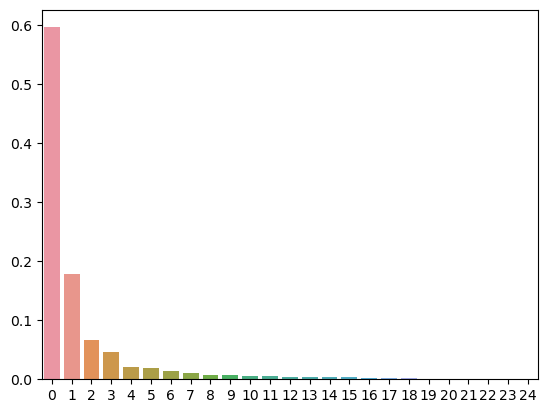

In [18]:
#VISUALIZE The percentage of variance explained by each of the selected components.
explained_var=pd.DataFrame(pca.explained_variance_ratio_).transpose()
print(explained_var)
ax = sns.barplot( data=explained_var)

In [19]:
cum_explained_var=np.cumsum(pca.explained_variance_ratio_)
cum_explained_var= pd.DataFrame(cum_explained_var).transpose()
cum_explained_var

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
0,0.596093,0.773704,0.840406,0.8864,0.907295,0.926937,0.940211,0.950948,0.95829,0.965186,...,0.989987,0.992334,0.994348,0.995691,0.996754,0.997661,0.998552,0.999219,0.999742,1.0


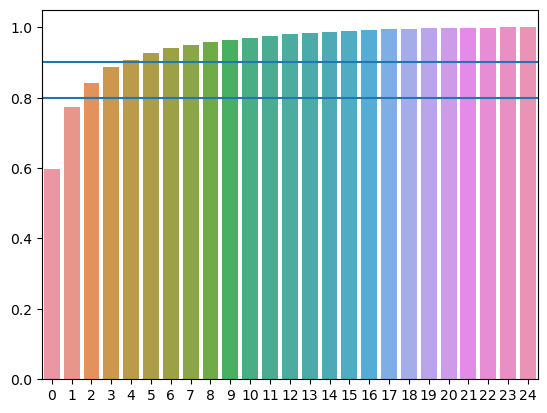

In [20]:
ax = sns.barplot(data=cum_explained_var)
ax.axhline(0.9)
ax.axhline(0.8)

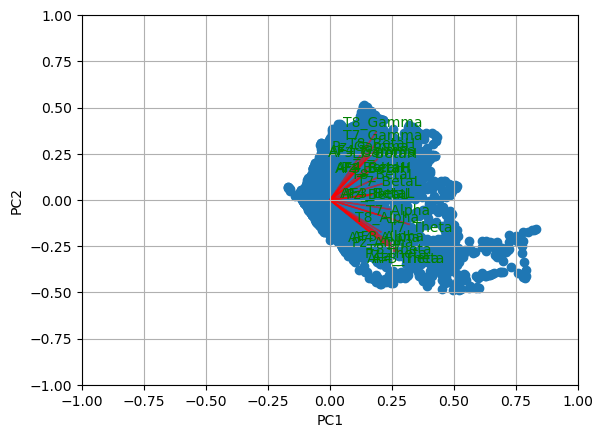

In [21]:
def myplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley)
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')
    plt.xlim(-1,1)
    plt.ylim(-1,1)
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))
    plt.grid()

#Call the function. Use only the 2 PCs.
myplot(pca.transform(pow_transformed)[:,0:2],np.transpose(pca.components_[0:2, :]), pow_transformed.columns)
plt.show()


#T7 Gamma e T8 Gamma --> correlazione 

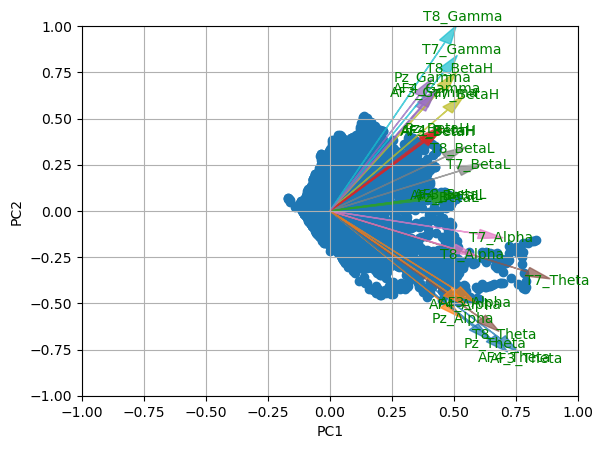

In [22]:
def myplot(score, coeff, labels=None, vector_scale=1.2):
    xs = score[:, 0]
    ys = score[:, 1]
    n = coeff.shape[0]
    scalex = 1.0 / (xs.max() - xs.min())
    scaley = 1.0 / (ys.max() - ys.min())
    plt.scatter(xs * scalex, ys * scaley)

    for i in range(n):
        scaled_coeff = coeff[i, :] * vector_scale
        plt.arrow(0, 0, scaled_coeff[0], scaled_coeff[1], color=f'C{i}', alpha=0.7, head_width=0.05, head_length=0.1)
        
        if labels is None:
            plt.text(scaled_coeff[0] * 1.15, scaled_coeff[1] * 1.15, "Var" + str(i + 1), color='g', ha='center', va='center')
        else:
            plt.text(scaled_coeff[0] * 1.15, scaled_coeff[1] * 1.15, labels[i], color='g', ha='center', va='center')

    plt.xlim(-1, 1)
    plt.ylim(-1, 1)
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))
    plt.grid()

# Call the function with longer and distinguishable vectors
myplot(pca.transform(pow_transformed)[:, 0:2], np.transpose(pca.components_[0:2, :]), pow_transformed.columns, vector_scale=2.5)
plt.show()


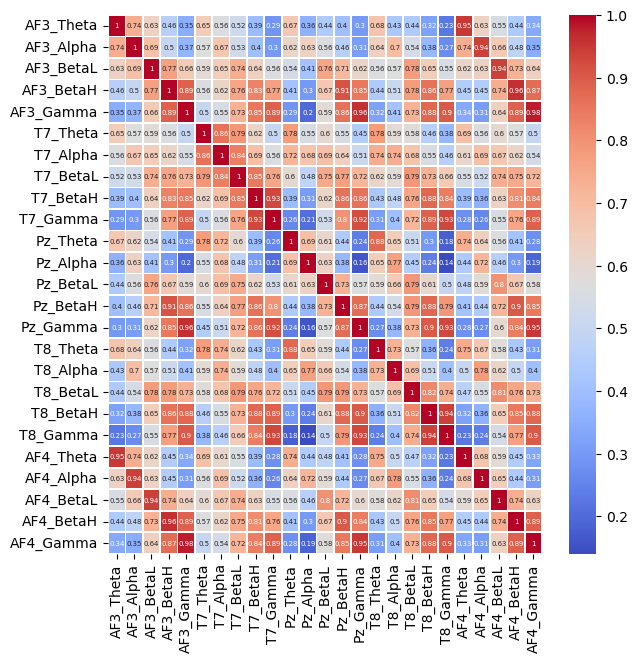

In [23]:
pow_transformed['Phase']=filtered_df['Phase']
plt.figure(figsize = (7,7))
sns.heatmap(data=pow_transformed.corr().round(2), cmap='coolwarm', linewidths=.5, annot=True, annot_kws={"size":5})
plt.show()


In [24]:
X = pow_transformed.copy()  # Make a copy to avoid modifying the original DataFrame
X = X.drop('Phase', axis=1)

print(X.shape)

(38279, 25)


In [25]:
X

,AF3_Theta,AF3_Alpha,AF3_BetaL,AF3_BetaH,AF3_Gamma,T7_Theta,T7_Alpha,T7_BetaL,T7_BetaH,T7_Gamma,...,T8_Theta,T8_Alpha,T8_BetaL,T8_BetaH,T8_Gamma,AF4_Theta,AF4_Alpha,AF4_BetaL,AF4_BetaH,AF4_Gamma
0,1.256755,1.619190,2.065723,1.554771,1.145178,1.584735,1.413180,1.696349,1.410987,1.313992,...,1.474305,2.329714,2.454276,1.561927,1.394511,1.393766,1.813684,2.068886,1.777661,1.148037
1,1.158138,1.555826,1.882514,1.582683,1.104263,1.464874,1.539015,1.761816,1.414882,1.246457,...,1.558986,2.401072,2.479308,1.456986,1.323355,1.276200,1.763531,1.908950,1.824388,1.133979
2,1.108563,1.497612,1.676162,1.595542,1.046968,1.338679,1.637442,1.808125,1.391779,1.177423,...,1.640161,2.401706,2.459418,1.368130,1.247032,1.232269,1.675787,1.733070,1.856298,1.106580
3,1.118088,1.525621,1.483421,1.594121,0.995472,1.267511,1.708015,1.818726,1.353513,1.136550,...,1.695432,2.345070,2.376114,1.305084,1.174338,1.240401,1.626885,1.569449,1.860975,1.075344
4,1.212239,1.682131,1.332630,1.592495,0.971915,1.297190,1.756823,1.781709,1.327340,1.143267,...,1.713438,2.253185,2.225164,1.277874,1.120374,1.380528,1.695799,1.436750,1.838961,1.050122
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38274,0.590561,0.743840,0.473747,0.368801,0.156149,0.297137,0.517603,0.378436,0.161268,0.169743,...,0.610309,0.454255,0.554460,0.446607,0.239804,0.939226,0.686626,0.396088,0.285931,0.192272
38275,0.640274,0.733329,0.463734,0.372942,0.165514,0.301585,0.556755,0.381172,0.156149,0.168054,...,0.588897,0.327143,0.527093,0.440189,0.231905,1.029619,0.711478,0.401457,0.304539,0.199670
38276,0.738121,0.709513,0.447247,0.366031,0.172271,0.314811,0.582216,0.390690,0.160417,0.162969,...,0.585005,0.224742,0.495915,0.416075,0.223144,1.122329,0.711969,0.415415,0.316270,0.203757
38277,0.842859,0.644482,0.427879,0.351361,0.173113,0.331460,0.581098,0.407463,0.174793,0.155293,...,0.607589,0.164667,0.461845,0.381172,0.218332,1.219058,0.678034,0.429832,0.320633,0.202941


In [26]:
y = (filtered_df['Phase'] == 'sudoku').astype(int)

print(len(y))


38279


In [27]:
from sklearn.model_selection import train_test_split

#SPLIT DATA INTO TRAIN AND TEST SET
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size =0.30,   
                                                    stratify=y,        #preserve target propotions (probviamo non stratificata)
                                                    random_state= 2)   #fix random seed for replicability

print( X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(26795, 25) (11484, 25) (26795,) (11484,)


In [28]:
X_train

,AF3_Theta,AF3_Alpha,AF3_BetaL,AF3_BetaH,AF3_Gamma,T7_Theta,T7_Alpha,T7_BetaL,T7_BetaH,T7_Gamma,...,T8_Theta,T8_Alpha,T8_BetaL,T8_BetaH,T8_Gamma,AF4_Theta,AF4_Alpha,AF4_BetaL,AF4_BetaH,AF4_Gamma
1544,1.033184,1.293631,1.214319,1.059178,1.283431,1.208064,1.538371,1.700740,1.681945,2.329519,...,0.746214,1.638997,2.212332,1.932680,2.287167,0.735248,1.319620,1.342081,1.078750,1.308333
22053,1.352738,1.586783,1.087214,0.471877,0.258511,1.833701,1.338154,0.503801,0.241376,0.327864,...,1.463024,2.505281,1.325217,0.906240,0.390690,1.296643,1.554348,1.330253,0.509825,0.266203
22984,1.863615,0.963174,1.648466,0.660107,0.707543,1.731479,1.547350,1.154678,0.826804,0.863312,...,1.737479,0.946238,1.522790,0.938052,1.073978,1.807305,0.956665,1.636469,0.708036,0.780242
36894,3.774782,2.231519,1.452316,0.718327,0.332894,0.966984,0.314081,0.253867,0.235862,0.174793,...,0.726098,0.360468,0.687632,0.264669,0.191446,3.119100,1.749895,0.962411,0.563038,0.311887
31682,2.042778,1.306981,0.954742,0.510426,0.223144,1.014143,0.759403,0.607044,0.827241,0.377751,...,1.229348,1.892961,1.174647,0.923465,0.747162,1.959531,1.865939,0.765468,0.462475,0.277632
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16070,1.632959,1.406097,0.816691,1.520607,1.579391,0.965843,0.882113,0.917490,1.556248,1.683617,...,1.643646,1.409034,1.006862,1.756132,1.712355,1.761128,1.477733,0.728514,1.425755,1.624327
29606,1.909691,1.952318,0.545227,0.285931,0.210261,0.602128,1.008323,0.275356,0.198851,0.116894,...,1.910727,1.669403,0.452985,0.459953,0.581657,2.545688,2.148618,0.573800,0.292670,0.266969
17595,1.238084,0.903813,0.369492,0.542906,0.308954,0.277632,0.412772,0.303801,0.361861,0.314081,...,1.033896,2.568865,0.707543,0.505612,0.373630,0.648673,1.350149,0.575489,0.671413,0.299364
19759,1.368894,1.102604,0.488580,0.522952,0.443403,0.734769,0.339325,0.468127,1.038154,0.989913,...,2.376114,1.463487,1.168449,0.737642,0.495915,1.518199,1.092930,0.598837,0.485508,0.400788


In [29]:
X_test

,AF3_Theta,AF3_Alpha,AF3_BetaL,AF3_BetaH,AF3_Gamma,T7_Theta,T7_Alpha,T7_BetaL,T7_BetaH,T7_Gamma,...,T8_Theta,T8_Alpha,T8_BetaL,T8_BetaH,T8_Gamma,AF4_Theta,AF4_Alpha,AF4_BetaL,AF4_BetaH,AF4_Gamma
31536,1.407811,1.088899,1.000264,0.795252,0.377066,1.033896,1.334211,1.069527,0.797958,0.704087,...,1.834340,1.948906,1.784399,0.851859,0.758935,1.704021,1.293356,1.509175,0.794801,0.438900
37262,1.948763,1.261581,0.581657,0.500775,0.154436,0.862046,0.263902,0.352767,0.297137,0.118672,...,0.335758,0.717840,0.639219,0.275356,0.208639,1.793924,0.724161,0.251537,0.508022,0.150143
33826,1.677470,1.144223,0.959350,0.582774,0.232698,0.765933,0.164667,0.181488,0.196389,0.155293,...,0.963937,0.745265,0.733329,0.434376,0.393393,1.881905,1.315872,0.937269,0.667316,0.236652
36021,1.259313,1.547137,0.630207,0.470004,0.327864,1.309413,0.891588,0.627541,0.408793,0.323532,...,1.146132,1.923665,0.545807,0.503197,0.280657,1.268074,1.664305,0.500169,0.504405,0.226338
9535,4.724605,3.049178,1.968231,3.186477,2.791901,1.845142,2.004179,1.795585,3.035770,2.495352,...,2.308269,1.991157,2.186051,3.137405,2.768706,3.262893,2.614911,1.835457,3.093902,2.757412
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29938,2.024853,2.244744,1.004302,0.568151,0.226338,1.186012,0.897719,0.293416,0.257738,0.144100,...,2.246332,2.017433,1.263562,1.140394,0.561329,2.092481,2.328253,1.297463,0.474991,0.191446
16531,1.726332,1.899268,1.877631,1.653837,1.560668,1.760097,1.614027,1.916628,1.812215,1.561717,...,1.723837,1.813847,1.865629,1.870417,1.730593,1.557091,1.900315,1.796913,1.584325,1.558355
27592,2.149317,1.274524,0.778407,0.534151,0.414755,2.785443,1.630220,1.100943,0.903003,0.835514,...,2.129421,1.809436,0.655445,0.402126,0.203757,2.213645,1.684916,0.995472,0.524729,0.422650
8360,0.623797,0.239804,0.374318,0.302324,0.126633,0.666803,0.352064,0.270790,0.375693,0.211071,...,0.669367,0.849296,0.700123,0.362558,0.189794,0.922273,0.460584,0.509224,0.379805,0.154436


In [30]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn import metrics 
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score

In [31]:
#Funzioni 
def hyperp_search(classifier, parameters):
    gs = GridSearchCV(classifier, parameters, cv=3, scoring = 'f1', verbose=10, n_jobs=-1)
    gs = gs.fit(X_train, y_train)
    print("f1_train: %f using %s" % (gs.best_score_, gs.best_params_))

    best_model = gs.best_estimator_
    y_pred = best_model.predict(X_test)
    y_pred_train = best_model.predict(X_train)
    print("\n")
    print("f1         train %.3f   test %.3f" % (f1_score(y_train, y_pred_train), f1_score(y_test, y_pred) ))  
    print("\n")
    print(confusion_matrix(y_test, y_pred))
    return ( f1_score(y_train, y_pred_train),f1_score(y_test, y_pred) )

def roc(model,X_train,y_train,X_test,y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    y_probs = model.predict_proba(X_test) #predict_proba gives the probabilities for the target (0 and 1 in your case) 

    fpr, tpr, thresholds1=metrics.roc_curve(y_test,  y_probs[:,1])

    import matplotlib.pyplot as plt
    plt.plot(fpr, tpr, label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

    auc = metrics.roc_auc_score(y_test, y_probs[:,1])
    print('AUC: %.3f' % auc)
    return (fpr, tpr ,auc)

In [32]:
from sklearn.neighbors import KNeighborsClassifier

classifier = KNeighborsClassifier()
parameters = {'n_neighbors':np.arange(1,10,1)}
knn_f1_train,knn_f1_test = hyperp_search(classifier,parameters)

Fitting 3 folds for each of 9 candidates, totalling 27 fits
f1_train: 0.993722 using {'n_neighbors': 1}


f1         train 1.000   test 0.998


[[4438   10]
 [  17 7019]]


In [33]:
#Tree
from sklearn.tree import DecisionTreeClassifier
classifier = DecisionTreeClassifier()
parameters = {'criterion': ['entropy','gini'], 
              'max_depth':          np.arange(5,10,1),
              'min_samples_split':  np.arange(5,50,1),
              'min_samples_leaf':   [2,4,6,7]}

tree_f1_train,tree_f1_test=hyperp_search(classifier,parameters)

Fitting 3 folds for each of 1800 candidates, totalling 5400 fits
f1_train: 0.939242 using {'criterion': 'gini', 'max_depth': 9, 'min_samples_leaf': 4, 'min_samples_split': 5}


f1         train 0.958   test 0.944


[[3978  470]
 [ 327 6709]]


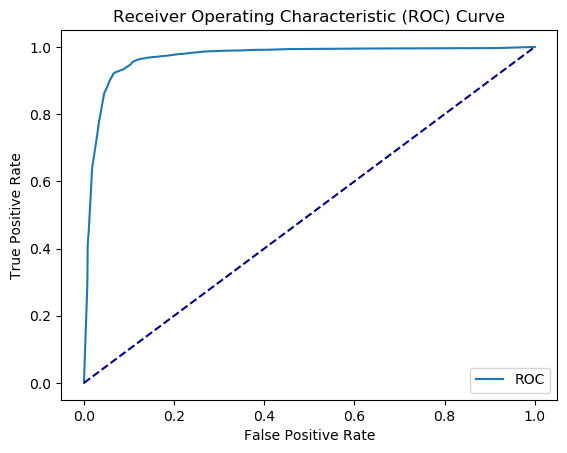

AUC: 0.97


In [36]:
from sklearn import metrics
model = DecisionTreeClassifier(criterion='gini', max_depth=9, min_samples_leaf=4, min_samples_split=5)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
y_probs = model.predict_proba(X_test) #predict_proba gives the probabilities for the target (0 and 1 in your case) 

fpr, tpr, thresholds=metrics.roc_curve(y_test,  y_probs[:,1])

import matplotlib.pyplot as plt

plt.plot(fpr, tpr, label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

auc = metrics.roc_auc_score(y_test, y_probs[:,1])
print('AUC: %.2f' % auc)

In [37]:
X_train.columns.tolist()

['AF3_Theta',
 'AF3_Alpha',
 'AF3_BetaL',
 'AF3_BetaH',
 'AF3_Gamma',
 'T7_Theta',
 'T7_Alpha',
 'T7_BetaL',
 'T7_BetaH',
 'T7_Gamma',
 'Pz_Theta',
 'Pz_Alpha',
 'Pz_BetaL',
 'Pz_BetaH',
 'Pz_Gamma',
 'T8_Theta',
 'T8_Alpha',
 'T8_BetaL',
 'T8_BetaH',
 'T8_Gamma',
 'AF4_Theta',
 'AF4_Alpha',
 'AF4_BetaL',
 'AF4_BetaH',
 'AF4_Gamma']

In [38]:
from sklearn import tree
r = tree.export_text(model,feature_names=X_test.columns.tolist())
print(r)


|--- Pz_Gamma <= 0.41
|   |--- Pz_Alpha <= 1.64
|   |   |--- T8_Gamma <= 0.22
|   |   |   |--- AF3_Theta <= 2.08
|   |   |   |   |--- Pz_Gamma <= 0.29
|   |   |   |   |   |--- T8_BetaL <= 0.60
|   |   |   |   |   |   |--- T7_Alpha <= 0.48
|   |   |   |   |   |   |   |--- AF3_BetaH <= 0.28
|   |   |   |   |   |   |   |   |--- T7_Gamma <= 0.09
|   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |--- T7_Gamma >  0.09
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |--- AF3_BetaH >  0.28
|   |   |   |   |   |   |   |   |--- AF3_Gamma <= 0.31
|   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |--- AF3_Gamma >  0.31
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- T7_Alpha >  0.48
|   |   |   |   |   |   |   |--- Pz_Theta <= 0.99
|   |   |   |   |   |   |   |   |--- T8_Alpha <= 0.33
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- T8_A

In [45]:
fig = plt.figure(figsize=(200,150))
_ = tree.plot_tree(model, 
                   feature_names=X_test.columns.tolist(),  
                   class_names=['0','1'],
                   filled=True, fontsize=40)

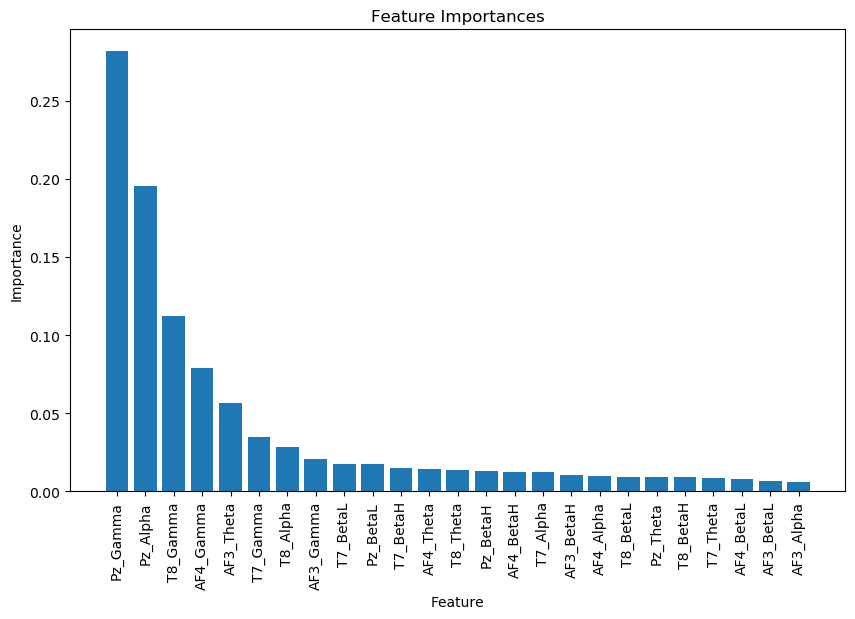

In [46]:
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt

# Create a decision tree model
model = DecisionTreeClassifier()

# Fit the model to your data
model.fit(X_train, y_train)

# Get feature importances
importances = model.feature_importances_

# Get the names of features
feature_names = X_train.columns

# Sort feature importances in descending order
indices = importances.argsort()[::-1]

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(X_train.shape[1]), importances[indices])
plt.xticks(range(X_train.shape[1]), feature_names[indices], rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.show()
